# Visualización de Anotaciones YOLO

Este notebook permite visualizar anotaciones aleatorias del dataset YOLO para verificar la calidad de las anotaciones y diagnosticar problemas con las predicciones.

**Dataset:** `/home/rodrigo/Desktop/maestria/trash-detection/data/yolo`

## 1. Importar Bibliotecas

In [19]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import os
import random
import yaml
from pathlib import Path
from collections import Counter

# Configurar matplotlib para mejor visualización
plt.rcParams['figure.figsize'] = (20, 12)
plt.rcParams['font.size'] = 10

print("✓ Bibliotecas importadas correctamente")

✓ Bibliotecas importadas correctamente


## 2. Configurar Rutas y Cargar Nombres de Clases

In [20]:
# Ruta base del dataset YOLO
YOLO_BASE_PATH = Path('/home/rodrigo/Desktop/maestria/trash-detection/data/yolo')
DATA_YAML_PATH = YOLO_BASE_PATH / 'data.yaml'

# Splits disponibles
SPLITS = ['train', 'val', 'test']

# Cargar nombres de clases desde data.yaml
with open(DATA_YAML_PATH, 'r') as f:
    data_config = yaml.safe_load(f)
    
CLASS_NAMES = data_config['names']
NUM_CLASSES = data_config['nc']

print(f"Dataset YOLO: {YOLO_BASE_PATH}")
print(f"Número de clases: {NUM_CLASSES}")
print(f"\nPrimeras 10 clases:")
for i, name in enumerate(CLASS_NAMES[:10]):
    print(f"  {i}: {name}")
print(f"  ...")
print(f"  {NUM_CLASSES-1}: {CLASS_NAMES[-1]}")

Dataset YOLO: /home/rodrigo/Desktop/maestria/trash-detection/data/yolo
Número de clases: 23

Primeras 10 clases:
  0: Aluminium foil
  1: Other plastic bottle
  2: Clear plastic bottle
  3: Glass bottle
  4: Plastic bottle cap
  5: Metal bottle cap
  6: Broken glass
  7: Drink can
  8: Other carton
  9: Corrugated carton
  ...
  22: Cigarette


## 3. Funciones de Utilidad

In [21]:
def load_yolo_annotations(label_path, img_width, img_height):
    """
    Carga anotaciones YOLO desde un archivo .txt
    
    Formato YOLO: class_id x_center y_center width height (valores normalizados 0-1)
    Retorna: Lista de tuplas (class_id, x_min, y_min, x_max, y_max) en píxeles
    """
    annotations = []
    
    if not os.path.exists(label_path):
        return annotations
    
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            
            class_id = int(parts[0])
            x_center = float(parts[1])
            y_center = float(parts[2])
            width = float(parts[3])
            height = float(parts[4])
            
            # Convertir de coordenadas normalizadas a píxeles
            x_center_px = x_center * img_width
            y_center_px = y_center * img_height
            width_px = width * img_width
            height_px = height * img_height
            
            # Convertir de centro-ancho-alto a esquinas
            x_min = int(x_center_px - width_px / 2)
            y_min = int(y_center_px - height_px / 2)
            x_max = int(x_center_px + width_px / 2)
            y_max = int(y_center_px + height_px / 2)
            
            annotations.append((class_id, x_min, y_min, x_max, y_max))
    
    return annotations


def get_random_color(seed=None):
    """Genera un color aleatorio para visualización"""
    if seed is not None:
        random.seed(seed)
    return tuple(random.randint(50, 255) for _ in range(3))


def visualize_image_with_annotations(img_path, label_path, ax=None):
    """
    Visualiza una imagen con sus anotaciones YOLO
    """
    # Leer imagen
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"Error: No se pudo cargar {img_path}")
        return None
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_height, img_width = img.shape[:2]
    
    # Cargar anotaciones
    annotations = load_yolo_annotations(label_path, img_width, img_height)
    
    # Crear figura si no se proporciona
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    
    # Mostrar imagen
    ax.imshow(img)
    
    # Dibujar bounding boxes
    colors = {}
    for class_id, x_min, y_min, x_max, y_max in annotations:
        # Color único por clase
        if class_id not in colors:
            colors[class_id] = get_random_color(class_id)
        
        color = tuple(c/255 for c in colors[class_id])
        
        # Dibujar rectángulo
        rect = patches.Rectangle(
            (x_min, y_min), 
            x_max - x_min, 
            y_max - y_min,
            linewidth=2, 
            edgecolor=color, 
            facecolor='none'
        )
        ax.add_patch(rect)
        
        # Añadir etiqueta
        class_name = CLASS_NAMES[class_id] if class_id < len(CLASS_NAMES) else f"Class {class_id}"
        ax.text(
            x_min, y_min - 5,
            class_name,
            color='white',
            fontsize=8,
            bbox=dict(boxstyle='round,pad=0.3', facecolor=color, alpha=0.7)
        )
    
    ax.axis('off')
    title = f"{img_path.name}\n{len(annotations)} objetos"
    ax.set_title(title, fontsize=10)
    
    return len(annotations)

print("✓ Funciones definidas correctamente")

✓ Funciones definidas correctamente


## 4. Visualizar Imágenes Aleatorias por Split


Split: TRAIN
Total de imágenes disponibles: 552


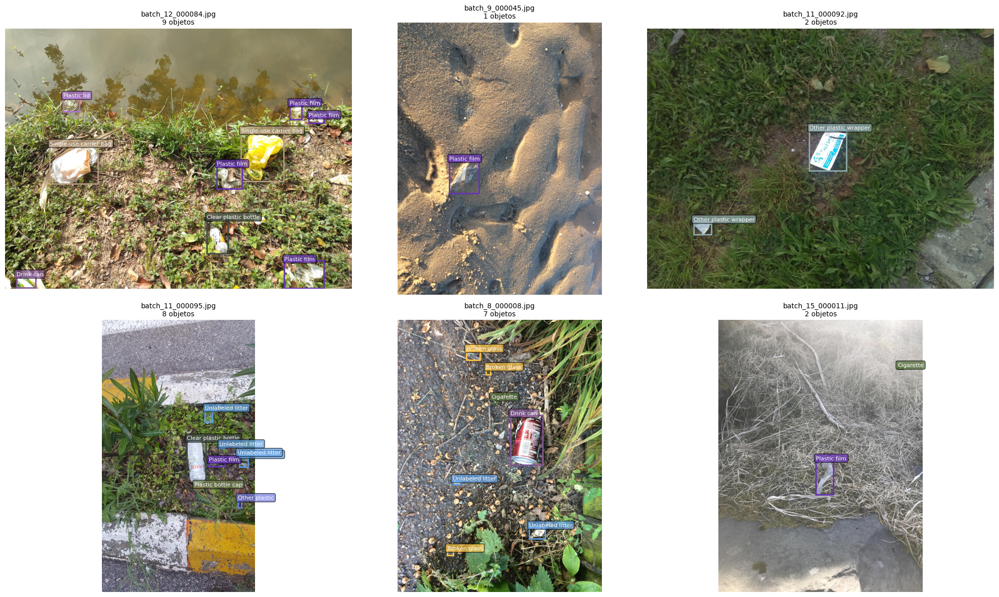

In [22]:
def visualize_random_samples(split='train', num_samples=6, seed=None):
    """
    Visualiza muestras aleatorias de un split específico
    """
    if seed is not None:
        random.seed(seed)
    
    # Rutas
    images_dir = YOLO_BASE_PATH / split / 'images'
    labels_dir = YOLO_BASE_PATH / split / 'labels'
    
    # Obtener lista de imágenes
    image_files = list(images_dir.glob('*.jpg')) + list(images_dir.glob('*.png'))
    
    if len(image_files) == 0:
        print(f"No se encontraron imágenes en {images_dir}")
        return
    
    print(f"\nSplit: {split.upper()}")
    print(f"Total de imágenes disponibles: {len(image_files)}")
    
    # Seleccionar muestras aleatorias
    num_samples = min(num_samples, len(image_files))
    selected_images = random.sample(image_files, num_samples)
    
    # Configurar grid
    cols = 3
    rows = (num_samples + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 6*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    for idx, img_path in enumerate(selected_images):
        row = idx // cols
        col = idx % cols
        ax = axes[row, col]
        
        # Buscar archivo de anotaciones correspondiente
        label_path = labels_dir / f"{img_path.stem}.txt"
        
        visualize_image_with_annotations(img_path, label_path, ax)
    
    # Ocultar subplots vacíos
    for idx in range(num_samples, rows * cols):
        row = idx // cols
        col = idx % cols
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualizar muestras de entrenamiento
visualize_random_samples('train', num_samples=6, seed=42)


Split: VAL
Total de imágenes disponibles: 125


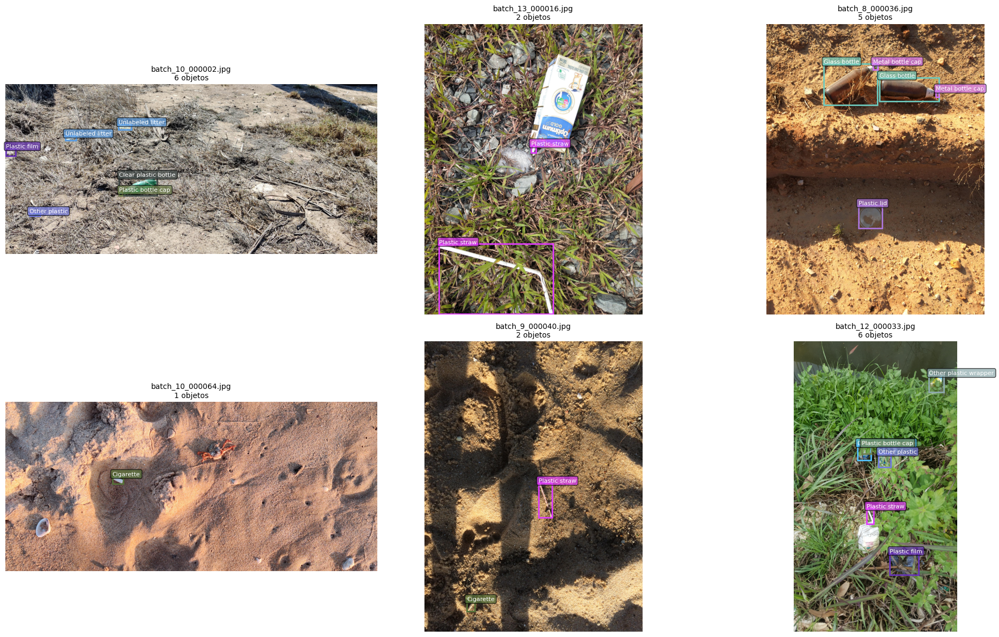

In [23]:
# Visualizar muestras de validación
visualize_random_samples('val', num_samples=6, seed=42)


Split: TEST
Total de imágenes disponibles: 114


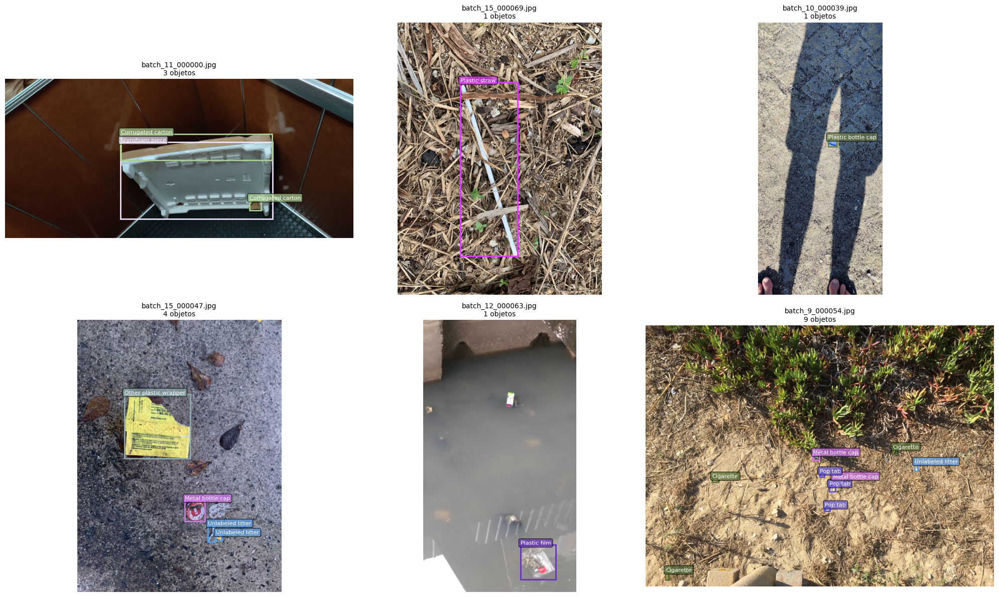

In [24]:
# Visualizar muestras de test
visualize_random_samples('test', num_samples=6, seed=42)

## 5. Estadísticas del Dataset

In [25]:
def analyze_dataset(split='train'):
    """
    Analiza las estadísticas del dataset para un split específico
    """
    images_dir = YOLO_BASE_PATH / split / 'images'
    labels_dir = YOLO_BASE_PATH / split / 'labels'
    
    image_files = list(images_dir.glob('*.jpg')) + list(images_dir.glob('*.png'))
    
    print(f"\n{'='*60}")
    print(f"ANÁLISIS DEL SPLIT: {split.upper()}")
    print(f"{'='*60}")
    
    if len(image_files) == 0:
        print(f"No se encontraron imágenes en {images_dir}")
        return
    
    # Contadores
    total_images = len(image_files)
    total_objects = 0
    class_distribution = Counter()
    bbox_sizes = []
    images_with_objects = 0
    images_without_objects = 0
    
    # Analizar cada imagen
    for img_path in image_files:
        label_path = labels_dir / f"{img_path.stem}.txt"
        
        # Obtener dimensiones de la imagen
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        img_height, img_width = img.shape[:2]
        
        # Cargar anotaciones
        annotations = load_yolo_annotations(label_path, img_width, img_height)
        
        if len(annotations) > 0:
            images_with_objects += 1
        else:
            images_without_objects += 1
        
        total_objects += len(annotations)
        
        # Analizar cada anotación
        for class_id, x_min, y_min, x_max, y_max in annotations:
            class_distribution[class_id] += 1
            
            # Tamaño del bounding box
            width = x_max - x_min
            height = y_max - y_min
            area = width * height
            bbox_sizes.append(area)
    
    # Imprimir estadísticas generales
    print(f"\n📊 Estadísticas Generales:")
    print(f"  Total de imágenes: {total_images}")
    print(f"  Imágenes con objetos: {images_with_objects} ({images_with_objects/total_images*100:.1f}%)")
    print(f"  Imágenes sin objetos: {images_without_objects} ({images_without_objects/total_images*100:.1f}%)")
    print(f"  Total de objetos anotados: {total_objects}")
    print(f"  Promedio de objetos por imagen: {total_objects/total_images:.2f}")
    
    # Distribución de clases
    print(f"\n📈 Top 10 Clases Más Frecuentes:")
    for class_id, count in class_distribution.most_common(10):
        class_name = CLASS_NAMES[class_id] if class_id < len(CLASS_NAMES) else f"Class {class_id}"
        percentage = count / total_objects * 100
        print(f"  {class_id:2d}. {class_name:30s}: {count:4d} ({percentage:5.2f}%)")
    
    # Clases menos frecuentes
    print(f"\n📉 Top 10 Clases Menos Frecuentes:")
    for class_id, count in class_distribution.most_common()[-10:]:
        class_name = CLASS_NAMES[class_id] if class_id < len(CLASS_NAMES) else f"Class {class_id}"
        percentage = count / total_objects * 100
        print(f"  {class_id:2d}. {class_name:30s}: {count:4d} ({percentage:5.2f}%)")
    
    # Estadísticas de bounding boxes
    if bbox_sizes:
        print(f"\n📦 Estadísticas de Bounding Boxes:")
        print(f"  Área mínima: {min(bbox_sizes):.0f} px²")
        print(f"  Área máxima: {max(bbox_sizes):.0f} px²")
        print(f"  Área promedio: {np.mean(bbox_sizes):.0f} px²")
        print(f"  Área mediana: {np.median(bbox_sizes):.0f} px²")
    
    return class_distribution, bbox_sizes

# Analizar cada split
for split in SPLITS:
    analyze_dataset(split)


ANÁLISIS DEL SPLIT: TRAIN

📊 Estadísticas Generales:
  Total de imágenes: 552
  Imágenes con objetos: 552 (100.0%)
  Imágenes sin objetos: 0 (0.0%)
  Total de objetos anotados: 1759
  Promedio de objetos por imagen: 3.19

📈 Top 10 Clases Más Frecuentes:
  22. Cigarette                     :  265 (15.07%)
  21. Unlabeled litter              :  227 (12.91%)
  15. Plastic film                  :  201 (11.43%)
  16. Other plastic wrapper         :  125 ( 7.11%)
   2. Clear plastic bottle          :  105 ( 5.97%)
  13. Other plastic                 :  104 ( 5.91%)
   7. Drink can                     :   94 ( 5.34%)
   6. Broken glass                  :   92 ( 5.23%)
   4. Plastic bottle cap            :   85 ( 4.83%)
  19. Plastic straw                 :   52 ( 2.96%)

📉 Top 10 Clases Menos Frecuentes:
  20. Styrofoam piece               :   43 ( 2.44%)
   8. Other carton                  :   36 ( 2.05%)
   5. Metal bottle cap              :   35 ( 1.99%)
   1. Other plastic bottle        

## 6. Visualización de Distribución de Clases

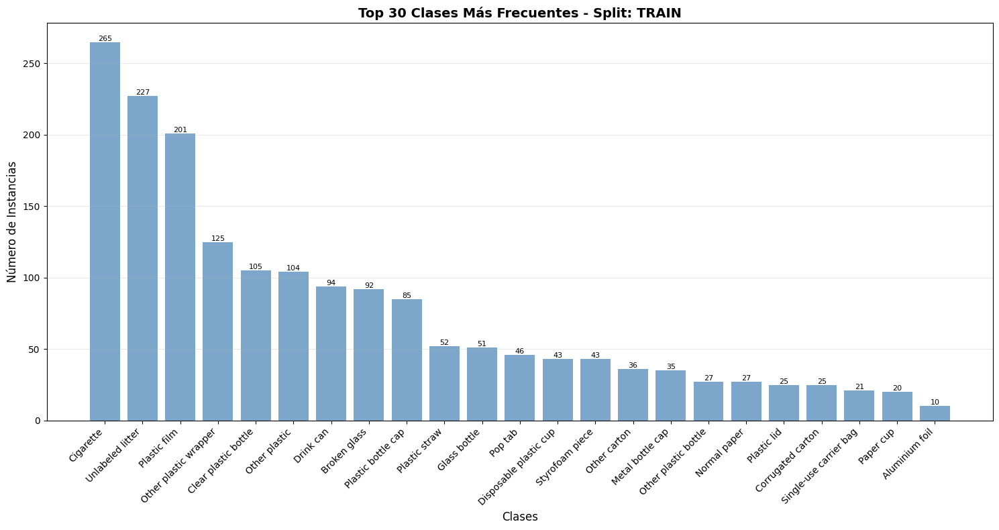

In [26]:
def plot_class_distribution(split='train', top_n=20):
    """
    Visualiza la distribución de clases en un gráfico de barras
    """
    images_dir = YOLO_BASE_PATH / split / 'images'
    labels_dir = YOLO_BASE_PATH / split / 'labels'
    
    image_files = list(images_dir.glob('*.jpg')) + list(images_dir.glob('*.png'))
    
    class_distribution = Counter()
    
    for img_path in image_files:
        label_path = labels_dir / f"{img_path.stem}.txt"
        
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        img_height, img_width = img.shape[:2]
        
        annotations = load_yolo_annotations(label_path, img_width, img_height)
        
        for class_id, _, _, _, _ in annotations:
            class_distribution[class_id] += 1
    
    # Preparar datos para el gráfico
    top_classes = class_distribution.most_common(top_n)
    class_names_list = [CLASS_NAMES[cid] if cid < len(CLASS_NAMES) else f"Class {cid}" 
                        for cid, _ in top_classes]
    counts = [count for _, count in top_classes]
    
    # Crear gráfico
    fig, ax = plt.subplots(figsize=(15, 8))
    bars = ax.bar(range(len(class_names_list)), counts, color='steelblue', alpha=0.7)
    
    ax.set_xlabel('Clases', fontsize=12)
    ax.set_ylabel('Número de Instancias', fontsize=12)
    ax.set_title(f'Top {top_n} Clases Más Frecuentes - Split: {split.upper()}', fontsize=14, fontweight='bold')
    ax.set_xticks(range(len(class_names_list)))
    ax.set_xticklabels(class_names_list, rotation=45, ha='right')
    ax.grid(axis='y', alpha=0.3)
    
    # Añadir valores en las barras
    for i, (bar, count) in enumerate(zip(bars, counts)):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(count)}',
                ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()
    
    return class_distribution

# Visualizar distribución para train
class_dist_train = plot_class_distribution('train', top_n=30)

## 7. Verificar Calidad de Anotaciones

Esta sección te permite explorar imágenes específicas para verificar la calidad de las anotaciones.


Split: TEST
Total de imágenes disponibles: 114


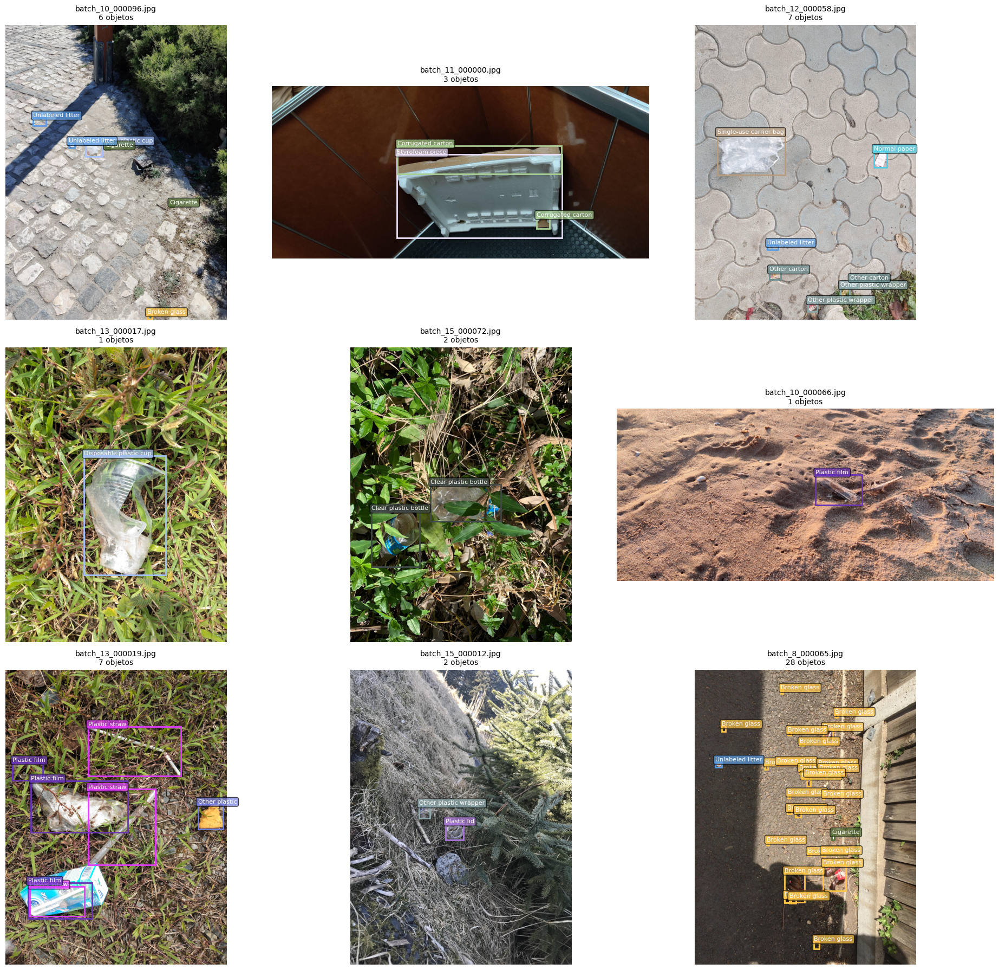

In [27]:
# Cambiar estos parámetros para explorar diferentes imágenes
SPLIT_TO_EXPLORE = 'test'  # 'train', 'val', o 'test'
NUM_RANDOM_SAMPLES = 9     # Número de imágenes a mostrar
RANDOM_SEED = None         # Cambiar para ver diferentes imágenes (None = aleatorio cada vez)

visualize_random_samples(SPLIT_TO_EXPLORE, num_samples=NUM_RANDOM_SAMPLES, seed=RANDOM_SEED)